<a href="https://colab.research.google.com/github/joshuacheng28/Advanced-artificial-intelligence/blob/main/2022_01_11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import csv
import numpy as np
import pandas as pd
from sklearn.utils import shuffle
import cv2 as cv
# Plot
import matplotlib.pyplot as plt
import seaborn as sns
# data
from collections import Counter
#import keras
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Dropout, Add, Average
from tensorflow.keras.layers import GlobalAveragePooling2D, Convolution2D, ReLU
from tensorflow.keras import optimizers
# callback
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping,TensorBoard
# model
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.models import Model, load_model
import zipfile
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
#download dataset
!gdown --id 1U1ERAMDixmRs3zSx41pVya3j05NeXBGD

zip_ref = zipfile.ZipFile('/content/archive.zip','r')
zip_ref.extractall('/content')
zip_ref.close()

Downloading...
From: https://drive.google.com/uc?id=1U1ERAMDixmRs3zSx41pVya3j05NeXBGD
To: /content/archive.zip
100% 363M/363M [00:11<00:00, 32.2MB/s]


In [ ]:
for dirpath,dirnames,filesnames in os.walk("/content/seg_train"):
    print(f'There are {len(dirnames)} directories and {len(filesnames)} images in {dirpath}')

There are 1 directories and 0 images in /content/seg_train
There are 6 directories and 0 images in /content/seg_train/seg_train
There are 0 directories and 2271 images in /content/seg_train/seg_train/forest
There are 0 directories and 2512 images in /content/seg_train/seg_train/mountain
There are 0 directories and 2404 images in /content/seg_train/seg_train/glacier
There are 0 directories and 2382 images in /content/seg_train/seg_train/street
There are 0 directories and 2191 images in /content/seg_train/seg_train/buildings
There are 0 directories and 2274 images in /content/seg_train/seg_train/sea


In [ ]:
import pathlib
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import cv2
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense,Flatten,Conv2D,MaxPool2D,Activation
from tensorflow.keras import Sequential
import tensorflow.keras.layers as Layers
import tensorflow.keras.activations as Actications
import tensorflow.keras.models as Models
from sklearn.utils import shuffle
import tensorflow.keras.optimizers as Optimizer

In [ ]:
data_dir = pathlib.Path('/content/seg_train/seg_train/')
folder = "/content/seg_train/seg_train/"

class_names = np.array(sorted([item.name for item in data_dir.glob("*")]))
class_names

array(['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street'],
      dtype='<U9')

In [ ]:
random_image = random.sample(os.listdir(folder+'buildings'),1)
img = mpimg.imread(folder+'buildings' + "/"+random_image[0])
img.shape

(150, 150, 3)

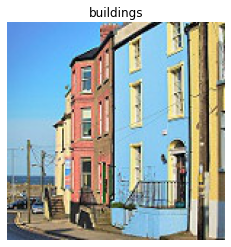

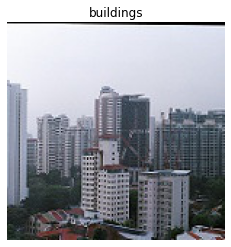

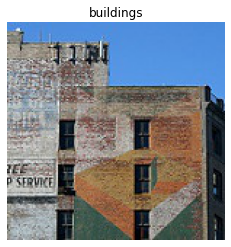

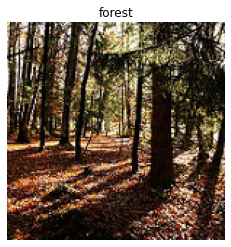

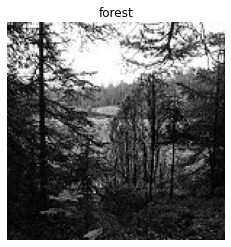

...

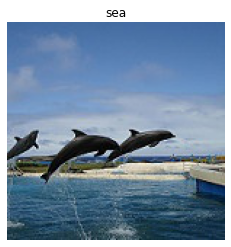

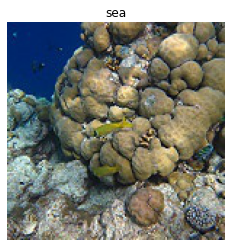

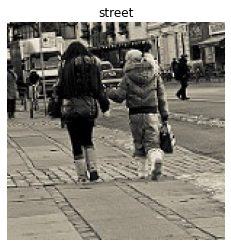

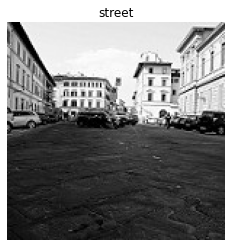

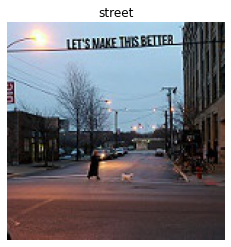

In [ ]:
for i in class_names:
    for x in range(3):
        plt.figure()
        random_image = random.sample(os.listdir(folder+'/'+i),1)
        img = mpimg.imread(folder+'/'+i + "/"+random_image[0])
        plt.imshow(img)
        plt.title(i)
        plt.axis('off')


In [ ]:
# Setup the train and test directories
train_dir = "/content/seg_train/seg_train/"
test_dir = "/content/seg_test/seg_test/"

In [ ]:
# this method come from https://www.kaggle.com/uzairrj/beg-tut-intel-image-classification-93-76-accur
def get_images(directory):
    Images = []
    Labels = []  # 0 for Building , 1 for forest, 2 for glacier, 3 for mountain, 4 for Sea , 5 for Street
    label = 0
    
    for labels in os.listdir(directory): #Main Directory where each class label is present as folder name.
        if labels == 'glacier': #Folder contain Glacier Images get the '2' class label.
            label = 2
        elif labels == 'sea':
            label = 4
        elif labels == 'buildings':
            label = 0
        elif labels == 'forest':
            label = 1
        elif labels == 'street':
            label = 5
        elif labels == 'mountain':
            label = 3
        
        for image_file in os.listdir(directory+labels): #Extracting the file name of the image from Class Label folder
            image = cv2.imread(directory+labels+r'/'+image_file) #Reading the image (OpenCV)
            image = cv2.resize(image,(150,150)) #Resize the image, Some images are different sizes. (Resizing is very Important)
            Images.append(image)
            Labels.append(label)
    
    return shuffle(Images,Labels,random_state=817328462) #Shuffle the dataset you just prepared.

In [ ]:
x_train,y_train = get_images(train_dir)
x_test,y_test = get_images(test_dir)

x_train = np.array(x_train) 
y_train = np.array(y_train)

x_test = np.array(x_test) 
y_test = np.array(y_test)

In [ ]:
# the model can be found in CNN Explainer
model = Sequential([
    Conv2D(10,3,activation='relu',input_shape=(150,150,3)),
    Conv2D(10,3,activation='relu'),
    MaxPool2D(pool_size=2),
    Conv2D(10,3,activation='relu'),
    Conv2D(10,3,activation='relu'),
    MaxPool2D(),
    Flatten(),
    Dense(6,activation='softmax')
])

model.compile(optimizer=Optimizer.Adam(lr=0.0001),loss='sparse_categorical_crossentropy',metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
history = model.fit(x_train,y_train,epochs=35,callbacks=[model_checkpoint_callback,
                              model_early_stopping, tensorboard])

Epoch 1/35
439/439 [==============================] - 15s 34ms/step - loss: 0.0330 - accuracy: 0.9929
Epoch 2/35
439/439 [==============================] - 15s 34ms/step - loss: 0.0238 - accuracy: 0.9958
Epoch 3/35
439/439 [==============================] - 15s 33ms/step - loss: 0.0194 - accuracy: 0.9979
Epoch 4/35
439/439 [==============================] - 15s 33ms/step - loss: 0.0334 - accuracy: 0.9942
Epoch 5/35
439/439 [==============================] - 15s 33ms/step - loss: 0.0193 - accuracy: 0.9971
Epoch 6/35
439/439 [==============================] - 15s 33ms/step - loss: 0.0208 - accuracy: 0.9975
Epoch 7/35
439/439 [==============================] - 15s 33ms/step - loss: 0.0187 - accuracy: 0.9974
Epoch 8/35
439/439 [==============================] - 15s 33ms/step - loss: 0.0228 - accuracy: 0.9964
Epoch 9/35
439/439 [==============================] - 15s 33ms/step - loss: 0.0362 - accuracy: 0.9914
Epoch 10/35
439/439 [==============================] - 15s 33ms/step - loss: 0.028

Text(0.5, 1.0, 'CNN Model')

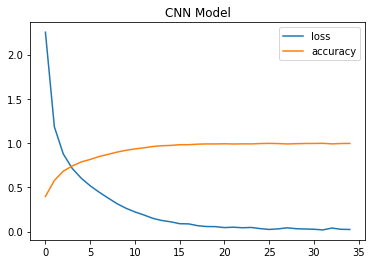

In [ ]:
import pandas as pd
pd.DataFrame(history.history).plot()
plt.title("CNN Model")

In [ ]:
model.evaluate(x_test,y_test)

94/94 [==============================] - 2s 15ms/step - loss: 2.3364 - accuracy: 0.6713


[2.3364181518554688, 0.6713333129882812]

In [ ]:
def pred_and_plot(model,img ,class_names=class_names):
  
    pred= model.predict(tf.expand_dims(img,axis=0))
    pred = tf.squeeze(pred)
  
    predicted_class = tf.argmax(pred)
    
    # plot the image and predicted class
    plt.figure()
    plt.imshow(img)
    plt.title(f'prediction:{class_names[predicted_class]}')
    plt.axis(False)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


<Figure size 432x288 with 0 Axes>

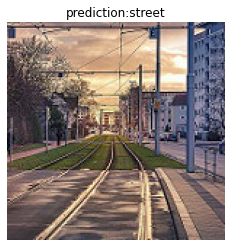

<Figure size 432x288 with 0 Axes>

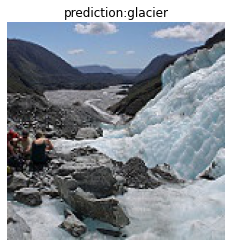

<Figure size 432x288 with 0 Axes>

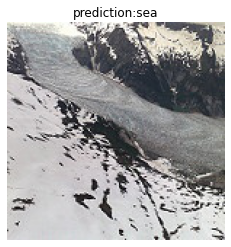

<Figure size 432x288 with 0 Axes>

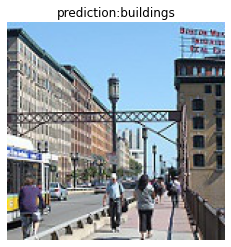

<Figure size 432x288 with 0 Axes>

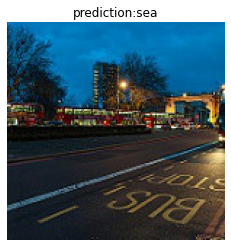

<Figure size 432x288 with 0 Axes>

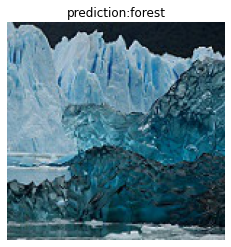

<Figure size 432x288 with 0 Axes>

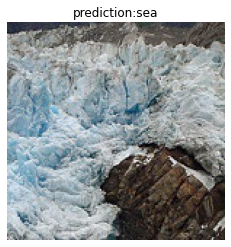

<Figure size 432x288 with 0 Axes>

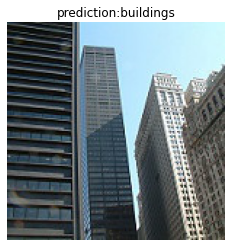

<Figure size 432x288 with 0 Axes>

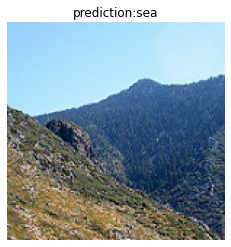

<Figure size 432x288 with 0 Axes>

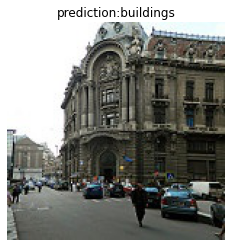

<Figure size 432x288 with 0 Axes>

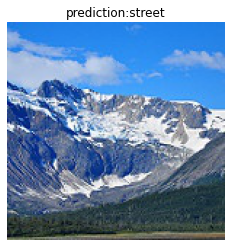

<Figure size 432x288 with 0 Axes>

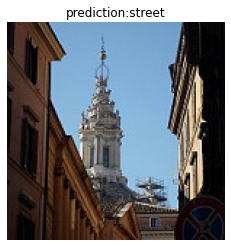

<Figure size 432x288 with 0 Axes>

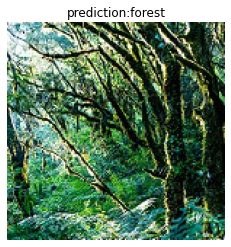

<Figure size 432x288 with 0 Axes>

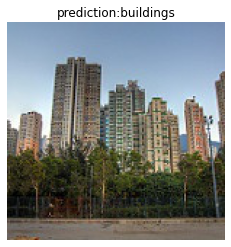

<Figure size 432x288 with 0 Axes>

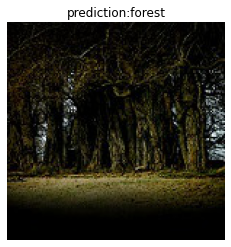

<Figure size 432x288 with 0 Axes>

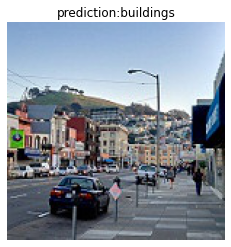

<Figure size 432x288 with 0 Axes>

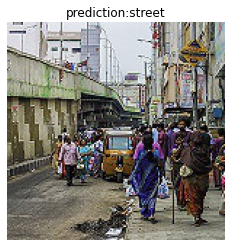

<Figure size 432x288 with 0 Axes>

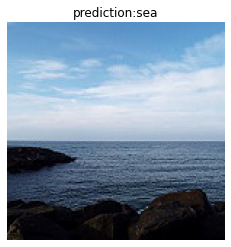

In [ ]:
folder = "/content//seg_pred/seg_pred/"
for i in class_names:
    for x in range(3):
        plt.figure()
        random_image = random.sample(os.listdir(folder),1)
        img = mpimg.imread(folder+"/"+random_image[0])
        pred_and_plot(model,img,class_names=class_names)

In [ ]:
checkpoint_filepath = '/content/tmp/checkpoint.h5'
if(not os.path.isdir('/content/tmp')):
  os.mkdir('/content/tmp')

model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weight_only = False,
    monitor='accuracy',
    mode='max',
    save_best_only=True
)
model_early_stopping = EarlyStopping(monitor = 'loss',
                                      min_delta = 0.00001,
                                      patience=5,
                                      mode='min',
                                      restore_best_weights=True)



In [ ]:
# Tensorboard
logpath = '/content/tmp/logs'
if(not os.path.exists(logpath)):
  os.mkdir('/content/tmp/logs')
tensorboard = TensorBoard(log_dir = logpath,
                          histogram_freq=1,
                          embeddings_freq=1)
%tensorboard --logdir '/content/tmp/logs'

Reusing TensorBoard on port 6007 (pid 442), started 0:47:46 ago. (Use '!kill 442' to kill it.)

<IPython.core.display.Javascript object>